# Are you looking for a new job in the field of data science and related disciplines in Germany?

## Investigation Overview

In this investigation, job listings for Germany are analyzed to answer the following questions:
1. For what kind of job in the field of data science and related disciplines in Germany should you apply?
1. What's the median salary for such a job in Germany?

## Dataset Overview

The data consists of 2 datasets:
1. 4,604 job listings for Germany from Glassdoor inclusive Title, City, Industry and Company Size
1. 5,610 job titles with reported Low, Median and High Base salaries for the employers that provided the job listings

In [35]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from textwrap import wrap

%matplotlib inline

# suppress warnings from final output
import warnings
warnings.simplefilter("ignore")

In [36]:
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
#sns.set_context('paper')
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

In [37]:
# Load the glassdoor dataset
glassdoor_clean = pd.read_csv('data/glassdoor_cleaned.csv.gz', compression='gzip')
# Load the salaries dataset
salaries_clean = pd.read_csv('data/salaries_cleaned.csv.gz', compression='gzip')

In [38]:
glassdoor_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4604 entries, 0 to 4603
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   location              4392 non-null   object
 1   job_title             4604 non-null   object
 2   industry              2942 non-null   object
 3   n_employees           3682 non-null   object
 4   posted                4604 non-null   object
 5   normalized_job_title  4132 non-null   object
dtypes: object(6)
memory usage: 215.9+ KB


In [39]:
salaries_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5610 entries, 0 to 5609
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   industry              5472 non-null   object 
 1   n_employees           5577 non-null   object 
 2   currency_code         5610 non-null   object 
 3   id                    5610 non-null   float64
 4   base_pay_count        5610 non-null   float64
 5   salaries_job_title    5610 non-null   object 
 6   pay_period            5610 non-null   object 
 7   pay_percentile_10     5610 non-null   float64
 8   pay_percentile_90     5610 non-null   float64
 9   pay_percentile_50     5610 non-null   float64
 10  normalized_job_title  1187 non-null   object 
dtypes: float64(5), object(6)
memory usage: 482.2+ KB


In [40]:
# Update dtypes for glassdoor dataset
glassdoor_clean.posted = pd.to_datetime(glassdoor_clean.posted)

n_employees_type = pd.api.types.CategoricalDtype(categories=['1 to 50 employees', '51 to 200 employees',
                                                             '201 to 500 employees', '501 to 1000 employees',
                                                             '1001 to 5000 employees', '5001 to 10000 employees', 
                                                             '10000+ employees'], ordered=True)
glassdoor_clean.n_employees= glassdoor_clean.n_employees.astype(dtype=n_employees_type)

glassdoor_job_title_categories = ['Software Engineer', 'Data Engineer', 'Data Scientist', 'Data Analyst', 
                                  'Business Analyst', 'Product Owner', 'Scrum Master', 'Engineering Manager', 
                                  'Project Manager', 'Product Manager', 'Machine Learning Engineer', 'Researcher']

glassdoor_normalized_job_title_type = pd.api.types.CategoricalDtype(categories=glassdoor_job_title_categories, 
                                                                    ordered=False)
glassdoor_clean.normalized_job_title = glassdoor_clean.normalized_job_title.astype(
    dtype=glassdoor_normalized_job_title_type)

glassdoor_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4604 entries, 0 to 4603
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   location              4392 non-null   object        
 1   job_title             4604 non-null   object        
 2   industry              2942 non-null   object        
 3   n_employees           3682 non-null   category      
 4   posted                4604 non-null   datetime64[ns]
 5   normalized_job_title  4132 non-null   category      
dtypes: category(2), datetime64[ns](1), object(3)
memory usage: 153.7+ KB


In [41]:
# Update dtypes for salaries dataset
salaries_clean.n_employees= salaries_clean.n_employees.astype(dtype=n_employees_type)

salaraies_job_title_categories = ['Software Engineer', 'Data Engineer', 'Data Scientist', 'Data Analyst', 
                                  'Business Analyst', 'Product Owner', 'Engineering Manager', 'Project Manager', 
                                  'Product Manager', 'Machine Learning Engineer', 'Researcher']
salaries_normalized_job_title_type = pd.api.types.CategoricalDtype(categories=salaraies_job_title_categories, 
                                                                    ordered=False)
salaries_clean.normalized_job_title = salaries_clean.normalized_job_title.astype(dtype=salaries_normalized_job_title_type)

salaries_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5610 entries, 0 to 5609
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   industry              5472 non-null   object  
 1   n_employees           5577 non-null   category
 2   currency_code         5610 non-null   object  
 3   id                    5610 non-null   float64 
 4   base_pay_count        5610 non-null   float64 
 5   salaries_job_title    5610 non-null   object  
 6   pay_period            5610 non-null   object  
 7   pay_percentile_10     5610 non-null   float64 
 8   pay_percentile_90     5610 non-null   float64 
 9   pay_percentile_50     5610 non-null   float64 
 10  normalized_job_title  1187 non-null   category
dtypes: category(2), float64(5), object(4)
memory usage: 406.3+ KB


In [42]:
# Define not null variables for glassdoor
job_location_not_null = glassdoor_clean.location.notnull().sum()
job_normalized_title_not_null = glassdoor_clean.normalized_job_title.notnull().sum()
job_n_employees_not_null = glassdoor_clean.n_employees.notnull().sum()
job_industry_not_null = glassdoor_clean.industry.notnull().sum()
job_features_not_null = glassdoor_clean[glassdoor_clean.location.notnull() & 
                                        glassdoor_clean.normalized_job_title.notnull() &
                                        glassdoor_clean.n_employees.notnull() & 
                                        glassdoor_clean.industry.notnull()].shape[0]

# Define not null variables for salaries
salaries_normalized_title_not_null = salaries_clean.normalized_job_title.notnull().sum()
salaries_n_employees_not_null = salaries_clean.n_employees.notnull().sum()
salaries_industry_not_null = salaries_clean.industry.notnull().sum()
salaries_features_not_null = salaries_clean[salaries_clean.normalized_job_title.notnull() & 
                                            salaries_clean.n_employees.notnull() & 
                                            salaries_clean.industry.notnull()].shape[0]


In [43]:
# Helper functions for creating and formatting pie charts
def pct_value_formatter_glassdoor(x):
    return pct_value_formatter(x, glassdoor_records)


def pct_value_formatter_jobs(x):
    return pct_value_formatter(x, glassdoor_clean.shape[0])


def pct_value_formatter_salaries(x):
    return pct_value_formatter(x, salaries_clean.shape[0])


def pct_value_formatter(x, n_total): 
    return '{:.1f}%\n({:,})'.format(x, int(np.round(x*n_total/100)))


def plot_pie(ax, sizes, labels, formatter, title):
    if len(sizes) == 3:
        explode = (0.1, 0, 0)
    elif len(sizes) == 2:
        explode = (0.1, 0)
    colors = sns.color_palette("Blues")
    wedges, texts, autotexts = ax.pie(x=sizes, autopct=formatter, startangle=90, 
                                      explode=explode, colors=colors, labeldistance=1.05)
    ax.set_title(title, size=12, weight="bold")
    for w in wedges:
        w.set_edgecolor('w')
    ax.legend(wedges, labels, fontsize=12, loc='lower right')
    #plt.axis('equal')
    plt.setp(autotexts, size=12, weight="bold", color="k")

## Feature Completeness

**Job Listings**: Title, City, Industry and Company Size<br>
**Salaries**: Job Title, Industry and Company Size, Low, Median and High Base Salary

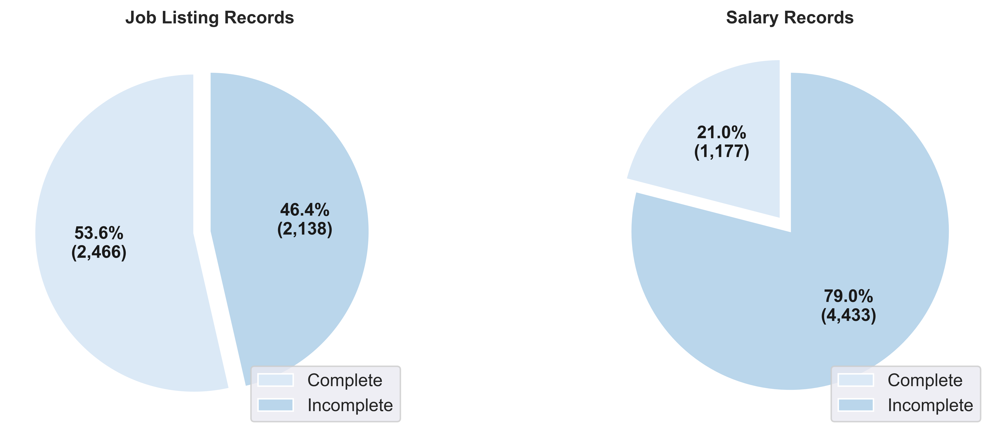

In [44]:
f, axes = plt.subplots(1, 2, figsize=(13,5))
pie_features_share_sizes = [job_features_not_null, glassdoor_clean.shape[0] - job_features_not_null]
pie_features_share_labels = ('Complete', 'Incomplete')
plot_pie(axes[0], pie_features_share_sizes, pie_features_share_labels, pct_value_formatter_jobs, 
         'Job Listing Records')

pie_features_share_sizes = [salaries_features_not_null, salaries_clean.shape[0] - salaries_features_not_null]
pie_features_share_labels = ('Complete', 'Incomplete')
plot_pie(axes[1], pie_features_share_sizes, pie_features_share_labels, pct_value_formatter_salaries, 
         'Salary Records')
#plt.suptitle('Feature Completeness', fontsize=14, weight="bold");

## When were the Job Listings posted?
Approx. **97%** of the job listings have been **posted between 2019-10-11 and 2019-11-10**. Based on the fact that the data was gathered on the 10th of December 2019, most listings are not older than 2 months. The remaining listings, especially the ones from 2018 and earlier 2019 might be outdated or a kind of permanent listings.

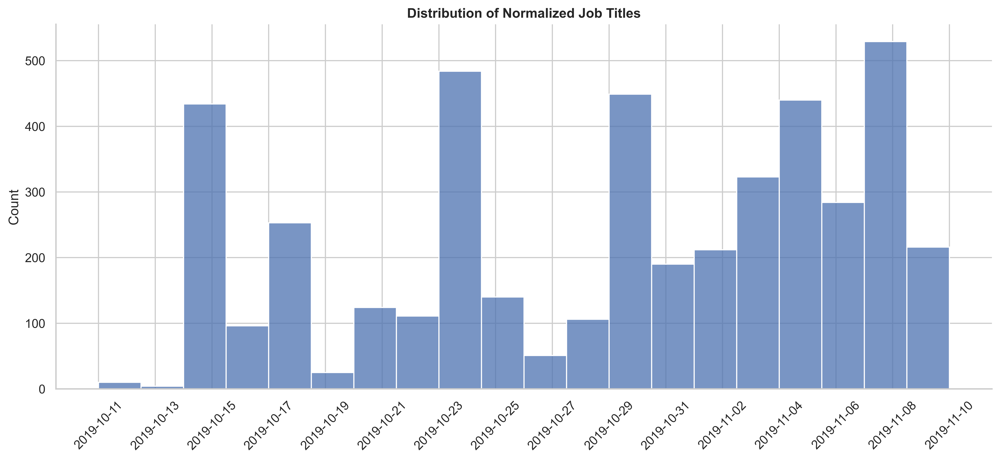

In [45]:
# Distribution of feature `posted` without outliers as histogram
posted_mask_dv = glassdoor_clean.posted > np.datetime64('2019-10-10')
sns.set_style("whitegrid")
plt.figure(figsize=(15,6))
ax = sns.histplot(glassdoor_clean[posted_mask_dv].posted)
xticks = np.arange(np.datetime64('2019-10-11'), np.datetime64('2019-11-12'), 2)
plt.xticks(xticks, rotation=45)
plt.xlabel("")
plt.ylabel('Count')
plt.title('Distribution of Normalized Job Titles', weight='bold')
sns.despine()

## What Job Titles are listed?
For approx. **90%** of the job listings a **normalized job title** could be assigned. The titles with the highest frequency are Software Engineer and Data engineer. **Project Manager, Data Scientist, Product Manager, Business Analyst, Data Analyst,  Researcher, Product Owner and Machine Learning Engineer** will be **considered** be **for further investigations**. The **Engineering Manager and Scrum Master** job listing frequencies **are outliers**. The normalized job titles do not have information about the job level, i.e. there is no differentiation between interns, entries or seniors.

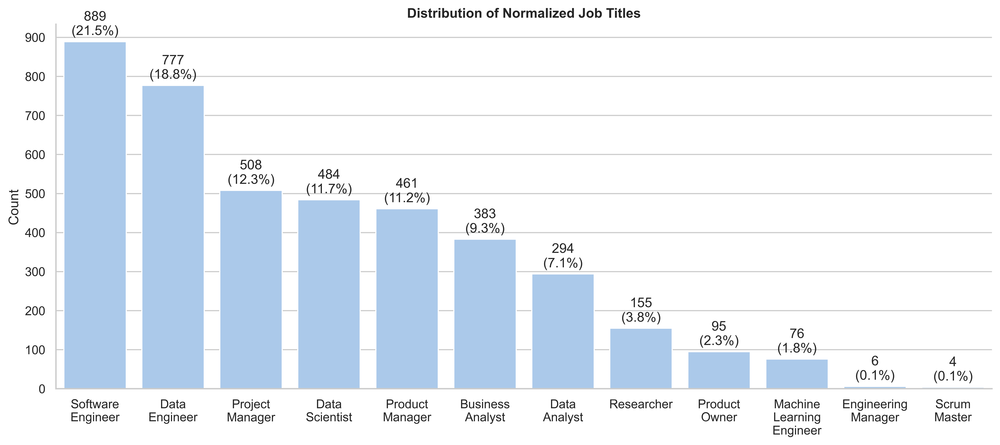

In [46]:
# Distribution of normalized titles sorted by highest count from left to right as countplot 
sns.set_style("whitegrid")
plt.figure(figsize=(15,6))
ax = sns.countplot(data=glassdoor_clean, x=glassdoor_clean.normalized_job_title, 
                   order=glassdoor_clean.normalized_job_title.value_counts().index,
                   color=sns.color_palette('pastel')[0])
for bar, label in zip(ax.patches, glassdoor_clean.normalized_job_title.value_counts().values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 10, 
             '{}\n({:.1%})'.format(label, label/job_normalized_title_not_null), ha='center', va='bottom')
xticklabels = ['\n'.join(wrap(l, 11)) for l in glassdoor_clean.normalized_job_title.value_counts().index]
#ax.set_xticklabels(glassdoor_clean.normalized_job_title.value_counts().index, ha='right', va='top', rotation=45)
ax.set_xticklabels(xticklabels, ha='center', va='top')
plt.xlabel("")
yticks = np.arange(0, 910, 100)
plt.yticks(yticks, yticks)
plt.ylabel('Count')
plt.title('Distribution of Normalized Job Titles', weight='bold')
sns.despine()

## What Company Sizes are listed?
For roughly **80%** of the job listings records the **company size** in terms of number of employees known. Those **job listings are well distributed among all company sizes**. Companies with more than **10000+ employees** provide the most job listings (**25%**). The **two smallest companies sizes** have the next highest shares with **each almost 20%**.

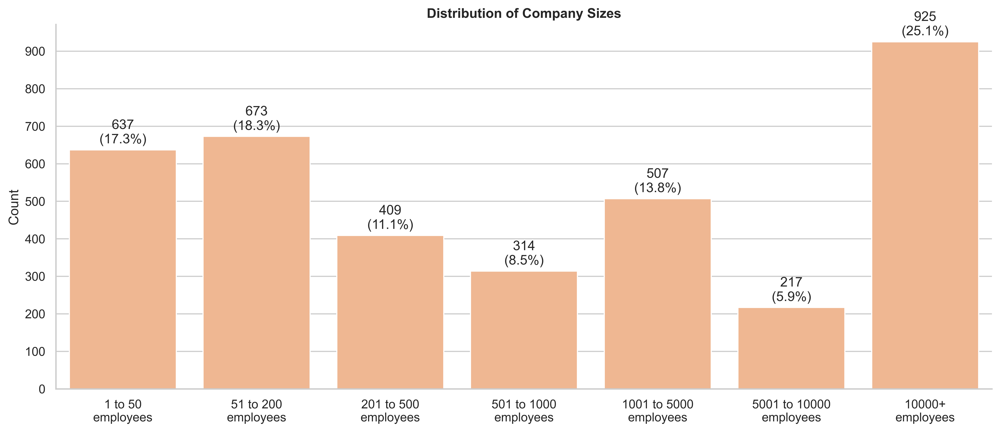

In [47]:
# Distribution of number of employees sorted by employee category size from left to right as countplot 
sns.set_style("whitegrid")
plt.figure(figsize=(15,6))
ax = sns.countplot(data=glassdoor_clean, x=glassdoor_clean.n_employees, 
                   color=sns.color_palette('pastel')[1])
val_counts_n_employees = dict(glassdoor_clean.n_employees.value_counts())
val_counts_n_employees_patches = []
for c in n_employees_type.categories:
    val_counts_n_employees_patches.append(val_counts_n_employees.get(c))
for bar, label in zip(ax.patches, val_counts_n_employees_patches):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 10, 
             '{}\n({:.1%})'.format(label, label/job_n_employees_not_null), ha='center', va='bottom')
xticklabels = ['\n'.join(wrap(l, 13)) for l in n_employees_type.categories]
ax.set_xticklabels(xticklabels, ha='center', va='top')
plt.xlabel("")
yticks = np.arange(0, 960, 100)
plt.yticks(yticks, yticks)
plt.ylabel('Count')
plt.title('Distribution of Company Sizes', weight='bold')
sns.despine()

## What Locations are listed?
The city is known for **96%** of the job listings. The **top 10 out of 344 unique locations are representing 65%** of the job listings that have a location provided. **55%** of the records that have a location **are within the top 5 locations**. **Berlin** has the highest frequency with more than 25%. This is more than twice of the job listings for the location **München (Munich)** with roughly 12%. The third top location **Frankfurt am Main**, the forth **Hamburg** and fifth **Köln (Cologne)** have roughly half as much of listings as München. The further investigation will focus just on the top 5 cities.

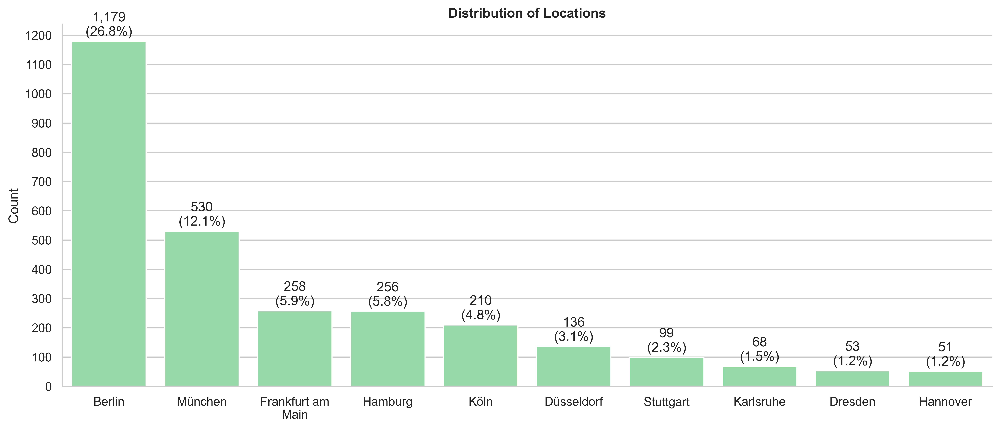

In [48]:
# Distribution of locations sorted by highest count from left to right as countplot 
top_10_job_locations_ordered = glassdoor_clean.location.value_counts()[:10]
mask_top_10_job_locations = glassdoor_clean.location.isin(top_10_job_locations_ordered.index)
sns.set_style("whitegrid")
plt.figure(figsize=(15,6))
ax = sns.countplot(data=glassdoor_clean[mask_top_10_job_locations], x='location', 
                   order=top_10_job_locations_ordered.index,
                   color=sns.color_palette('pastel')[2])
for bar, label in zip(ax.patches, top_10_job_locations_ordered.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 10, 
             '{:,}\n({:.1%})'.format(label, label/job_location_not_null), ha='center', va='bottom')
xticklabels = ['\n'.join(wrap(l, 13)) for l in top_10_job_locations_ordered.index]
ax.set_xticklabels(xticklabels, ha='center', va='top')
#ax.set_xticklabels(top_10_job_locations_ordered.index, ha='right', va='top', rotation=45)
plt.xlabel("")
yticks = np.arange(0, 1210, 100)
plt.yticks(yticks, yticks)
plt.ylabel('Count')
plt.title('Distribution of Locations', weight='bold')
sns.despine()

## What Industries are listed?
For **only 64%** of the job listings the employer **industry is known**. The **top 10 out of 91 unique industries are representing 60%** of the job listings that have an industry provided. **47%** of the records that have an industry **are within the top 5 industries**. The **Internet industry** has the highest frequency with more than **16%**. It's remarkable that the **top 4 industries are IT-related** and sum up to a share of **approx. 40.5%**. The further investigation will focus just on the top 5 industries.

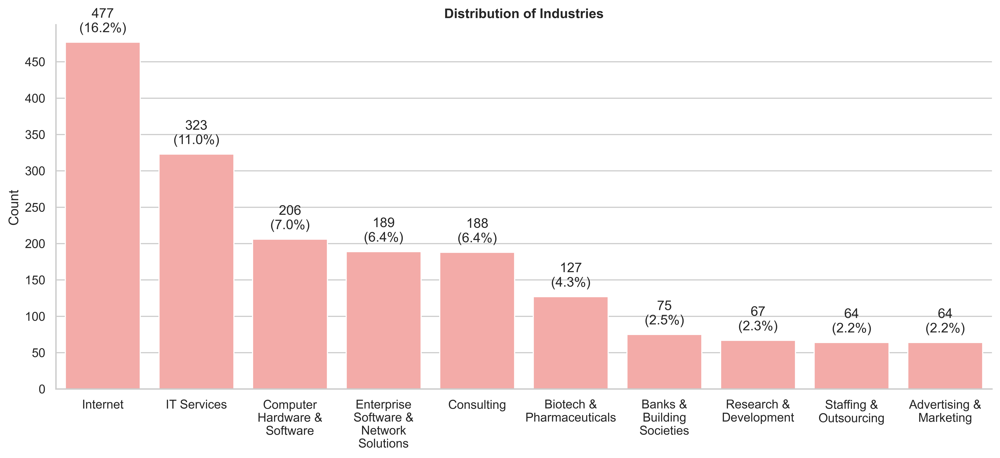

In [49]:
# Distribution of industry sorted by highest count from left to right as countplot 
top_10_job_industry_ordered = glassdoor_clean.industry.value_counts()[:10]
mask_top_10_job_industry = glassdoor_clean.industry.isin(top_10_job_industry_ordered.index)
sns.set_style("whitegrid")
plt.figure(figsize=(15,6))
ax = sns.countplot(data=glassdoor_clean[mask_top_10_job_industry], x='industry', 
                   order=top_10_job_industry_ordered.index,
                   color=sns.color_palette('pastel')[3])
for bar, label in zip(ax.patches, top_10_job_industry_ordered.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 10,
             '{}\n({:.1%})'.format(label, label/job_industry_not_null), ha='center', va='bottom')
xticklabels = ['\n'.join(wrap(l, 15)) for l in top_10_job_industry_ordered.index]
ax.set_xticklabels(xticklabels, ha='center', va='top')
#ax.set_xticklabels(top_10_job_industry_ordered.index, ha='right', va='top', rotation=45)
plt.xlabel("")
yticks = np.arange(0, 500, 50)
plt.yticks(yticks, yticks)
plt.ylabel('Count')
plt.title('Distribution of Industries', weight='bold')
sns.despine()

## For which Job Titles were Salaries reported?
**21%** of the records have a **normalized job title**. Out of this, roughly **49%** of the reported salaries are **Software Engineers**. This is more than twice of the second largest frequency share representing Project Manager (19%). The **top 5 cover 97%** of the frequency share. The **remaining 3%** share will **not be considered for further investigations**. Especially, the job titles Data Analyst, Data Scientist and Data Engineer had high frequencies for job listings, but have almost no salary reports.

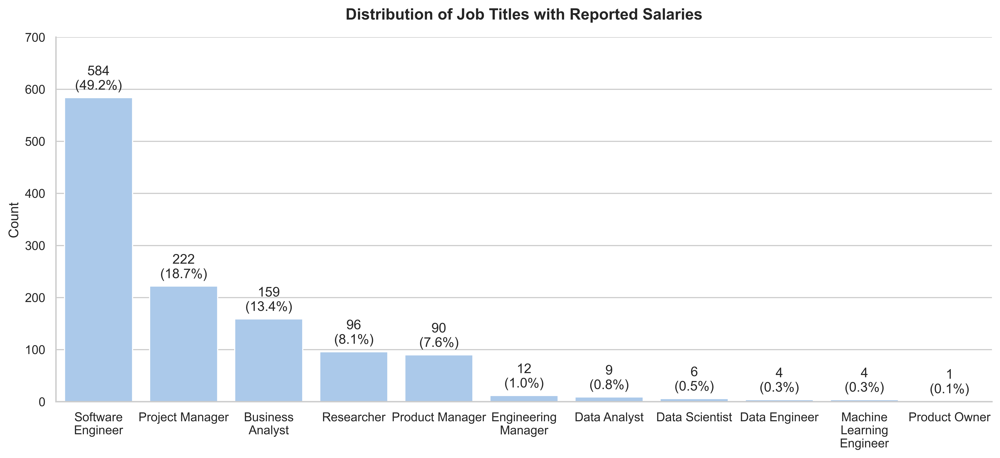

In [50]:
# Distribution of normalized titles sorted by highest count from left to right as countplot 
sns.set_style("whitegrid")
plt.figure(figsize=(15,6))
ax = sns.countplot(data=salaries_clean, x=salaries_clean.normalized_job_title, 
                   order=salaries_clean.normalized_job_title.value_counts().index,
                   color=sns.color_palette('pastel')[0])
for bar, label in zip(ax.patches, salaries_clean.normalized_job_title.value_counts().values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 10, 
             '{}\n({:.1%})'.format(label, label/salaries_normalized_title_not_null), ha='center', va='bottom')
xticklabels = ['\n'.join(wrap(l, 15)) for l in salaries_clean.normalized_job_title.value_counts().index]
ax.set_xticklabels(xticklabels, ha='center', va='top')
#ax.set_xticklabels(salaries_clean.normalized_job_title.value_counts().index, ha='right', va='top', rotation=45)
plt.xlabel("")
yticks = np.arange(0, 710, 100)
plt.yticks(yticks, yticks)
plt.ylabel('Count')
plt.title('Distribution of Job Titles with Reported Salaries', weight='bold', fontsize=14, y=1.03);
sns.despine()

In [51]:
mask_top_normalized_job_title = ~glassdoor_clean.normalized_job_title.isin(['Engineering Manager', 'Scrum Master'])

glassdoor_top_normalized_job_title = glassdoor_clean[mask_top_normalized_job_title].copy()

# Update the normalized_job_title categorical dtype in order to avoid 
# plotting 'Engineering Manager' and 'Scrum Master' titles with 0 values
top_normalized_job_title_categories = np.array(glassdoor_top_normalized_job_title.normalized_job_title.values.categories)
top_normalized_job_title_categories = np.delete(top_normalized_job_title_categories, 
                                                [i for i in range(len(top_normalized_job_title_categories)) 
                                                 if top_normalized_job_title_categories[i] in 
                                                 ['Engineering Manager', 'Scrum Master']])
top_normalized_job_title_type = pd.api.types.CategoricalDtype(categories=top_normalized_job_title_categories, ordered=False)
glassdoor_top_normalized_job_title.normalized_job_title = glassdoor_top_normalized_job_title.normalized_job_title.astype(
    dtype=top_normalized_job_title_type)

glassdoor_top_location_names = glassdoor_clean.location.value_counts()[:5].index
mask_top_location = glassdoor_clean.location.isin(glassdoor_top_location_names)
glassdoor_top_location = glassdoor_clean[mask_top_location].copy()

glassdoor_top_industry = glassdoor_clean.industry.value_counts()[:5].index
mask_top_industry = glassdoor_clean.industry.isin(glassdoor_top_industry)
glassdoor_top_industry = glassdoor_clean[mask_top_industry].copy()

glassdoor_top_normalized_job_title_location = glassdoor_top_normalized_job_title[
    glassdoor_top_normalized_job_title.location.isin(
        glassdoor_top_normalized_job_title.location.value_counts()[:5].index)]

glassdoor_top_normalized_job_title_industry = glassdoor_top_normalized_job_title[
    glassdoor_top_normalized_job_title.industry.isin(
        glassdoor_top_normalized_job_title.industry.value_counts()[:5].index)]

glassdoor_top_industry_location = glassdoor_top_industry[
    glassdoor_top_industry.location.isin(glassdoor_top_industry.location.value_counts()[:5].index)]

## Which Job Titles are most frequently listed among the company sizes?
For almost each of the top 5 normalized job titles large companies with more than 10,000 employees seem to have the largest share of job listings. Only for Product Owner the share of such large companies is clearly smaller. The smallest companies with less than 201 employees have often the second largest share of job listings. It's eyecatching that **small companies count more job listings for Product Owner than large companies. Software Engineers and Data Engineers are the most listed among all company sizes**.

<p style='text-align:center'>Illustration   <span>&#9660;</span><p/>

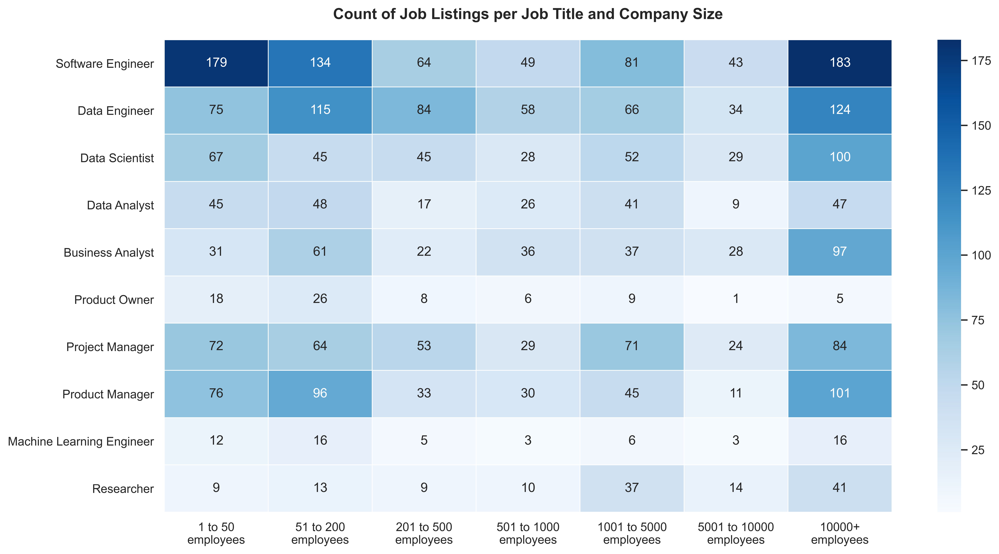

In [52]:
sns.set_style("whitegrid")
glassdoor_top_normalized_job_title_n_employees_count = glassdoor_top_normalized_job_title.groupby(
    by=['normalized_job_title', 'n_employees']).posted.count()
glassdoor_top_normalized_job_title_n_employees_count = glassdoor_top_normalized_job_title_n_employees_count.reset_index(
    name='count')
glassdoor_top_normalized_job_title_n_employees_count = glassdoor_top_normalized_job_title_n_employees_count.pivot(
    index='normalized_job_title', columns='n_employees', values='count')
f, ax = plt.subplots(figsize=(15,8))
sns.heatmap(glassdoor_top_normalized_job_title_n_employees_count, annot=True, fmt='d', linewidths=.5, ax=ax, 
            cmap='Blues')
xticklabels = ['\n'.join(wrap(l, 15)) for l in n_employees_type.categories]
ax.set_xticklabels(xticklabels, ha='center', va='top', rotation=0)
plt.xlabel('')
plt.ylabel('')
plt.title('Count of Job Listings per Job Title and Company Size', weight='bold', fontsize=14, y=1.03);

## Which Job Titles are most frequently listed among the top 5 locations?
Especially in **Berlin**, but also in **München (Munich)** and **Köln (Cologne) Software Engineer** listings have the highest share. For **Frankfurt am Main Business Analysts** and for **Hamburg Data Scientists** are most listed. The **second largest shares for all locations, besides Berlin, are Data Engineer** listings. In Berlin, it is the third largest share, which is still larger than the largest share of listings of other locations. The **second largest share in Berlin by far is Product Manager**. This is unusual compared to the large shares of other location.

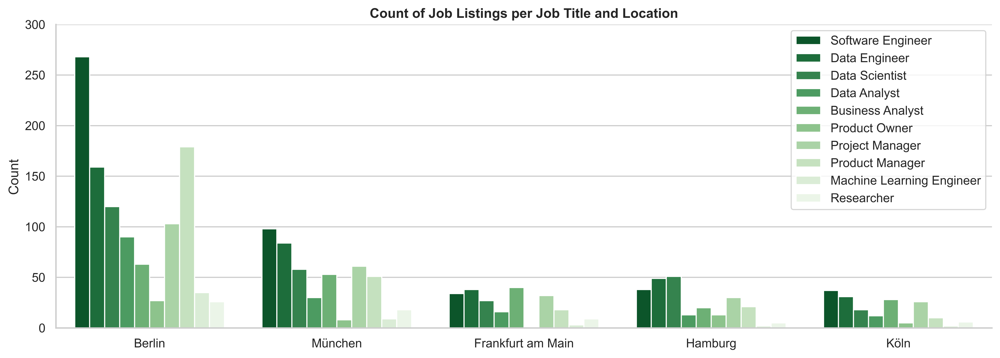

In [53]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,5))
g = sns.countplot(data=glassdoor_top_normalized_job_title_location, x='location', hue='normalized_job_title', 
              order=glassdoor_top_normalized_job_title_location.location.value_counts().index, palette='Greens_r');
g.legend_.set_title(None)
plt.xlabel('')
yticks = np.arange(0, 310, 50)
plt.yticks(yticks, yticks)
plt.ylabel('Count')
plt.title('Count of Job Listings per Job Title and Location', weight='bold')
sns.despine()

## Which Job Titles are most frequently listed among the top 5 industries?
Job listings of **Software Engineers** have the largest share in **Internet, Computer Hardware & Software and Enterprise Software & Network Solutions** by far. In **IT Services and Consulting** industry it's a large share, but not the largest. Instead **Data Engineers** are most listed for those industries. The **second largest share** in **Internet industry by far is Product Manager**. This is unusual compared to the large shares of other industries.

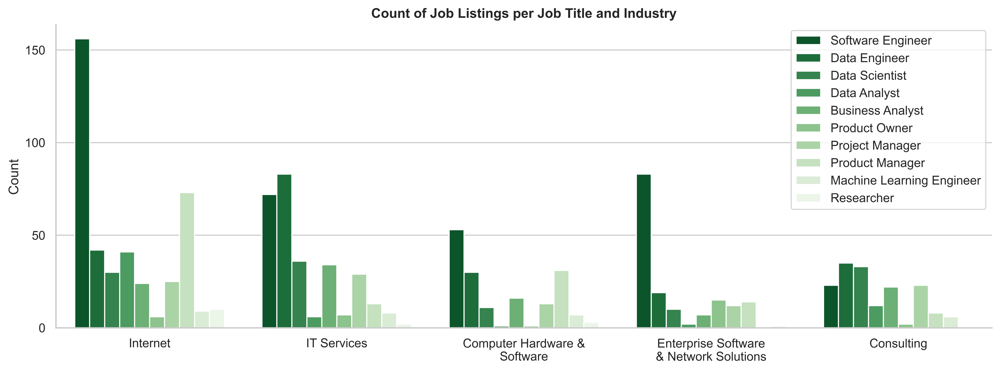

In [54]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,5))
g = sns.countplot(data=glassdoor_top_normalized_job_title_industry, x='industry', hue='normalized_job_title', 
                  order=glassdoor_top_normalized_job_title_industry.industry.value_counts().index, palette='Greens_r')
labels = ['\n'.join(wrap(l, 20)) for l in glassdoor_top_normalized_job_title_industry.industry.value_counts().index]
g.set_xticklabels(labels, ha='center', va='top')
plt.legend(loc='upper right')
g.legend_.set_title(None)
yticks = np.arange(0, 161, 50)
plt.yticks(yticks, yticks)
plt.xlabel('')
plt.ylabel('Count')
plt.title('Count of Job Listings per Job Title and Industry', weight='bold')
sns.despine()

In [55]:
salaries_top_normalized_job_title_names = salaries_clean.normalized_job_title.value_counts()[:5].index
mask_salaries_top_normalized_job_title = salaries_clean.normalized_job_title.isin(salaries_top_normalized_job_title_names)
salaries_top_normalized_job_title = salaries_clean[mask_salaries_top_normalized_job_title].copy()

# Update the normalized_job_title categorical dtype in order to avoid 
# plotting not top 5 titles with 0 values
salaries_top_normalized_job_title_categories = np.array(salaries_clean.normalized_job_title.values.categories)
salaries_top_normalized_job_title_categories = np.delete(salaries_top_normalized_job_title_categories, 
                                                [i for i in range(len(salaries_top_normalized_job_title_categories)) 
                                                 if salaries_top_normalized_job_title_categories[i] not in 
                                                 salaries_top_normalized_job_title_names])

salaries_top_normalized_job_title_type = pd.api.types.CategoricalDtype(categories=salaries_top_normalized_job_title_categories, 
                                                                       ordered=False)
salaries_top_normalized_job_title.normalized_job_title = salaries_top_normalized_job_title.normalized_job_title.astype(
    dtype=salaries_top_normalized_job_title_type)

salaries_top_normalized_job_title_annual = salaries_top_normalized_job_title[
    salaries_top_normalized_job_title.pay_period == 'ANNUAL'].copy()

salaries_top_industry_names = salaries_clean.industry.value_counts()[:5].index
mask_salaries_top_industry = salaries_clean.industry.isin(salaries_top_industry_names)
salaries_top_industry = salaries_clean[mask_salaries_top_industry].copy()
salaries_top_industry_annual = salaries_top_industry[salaries_top_industry.pay_period == 'ANNUAL'].copy()

## For which of the top 5 job titles were the most Salaries reported?
**5 times** more salaries have been **reported for Software Engineers (67%) compared to** the second largest number of reported salaries for **Project Manager (13%)**. For Business Analyst 11%, for Product Manager 5% and 3% for Researcher have been reported. 

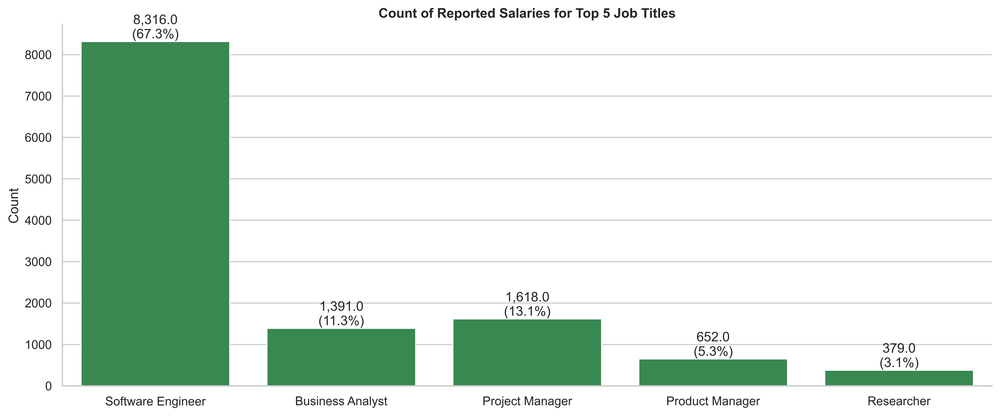

In [56]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,6))
salaries_top_normalized_job_title_annual_base_pay_count_sum = salaries_top_normalized_job_title_annual.groupby(
    by=['normalized_job_title']).base_pay_count.sum()
ax = sns.barplot(x=salaries_top_normalized_job_title_annual_base_pay_count_sum.index, 
            y=salaries_top_normalized_job_title_annual_base_pay_count_sum.values, color=sns.color_palette('Greens_r')[1])
for bar, label in zip(ax.patches, salaries_top_normalized_job_title_annual_base_pay_count_sum.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 10,
             '{:,}\n({:.1%})'.format(label, label/salaries_top_normalized_job_title_annual_base_pay_count_sum.sum()), 
             ha='center', va='bottom')
yticks = np.arange(0, 8100, 1000)
plt.yticks(yticks, yticks)
plt.xlabel('')
plt.ylabel('Count');
plt.title('Count of Reported Salaries for Top 5 Job Titles', weight='bold')
sns.despine()

## For which of the top 5 job titles were the Highest Mean Salaries reported?
The **highest average salaries** are reported for **Product Managers** by far. The next higher average salaries are for Project Managers followed by Software Engineers by only a slight difference. The mean median salary of those jobs titles is approx. at the same level as the low salary of Product Managers. Business Analyst average salaries are lower than Software Engineers. The mean high salary of Business Analysts is approx. at the same level as the mean median average salaries of Software Engineers. Researcher have by far the lowest salaries reported. 

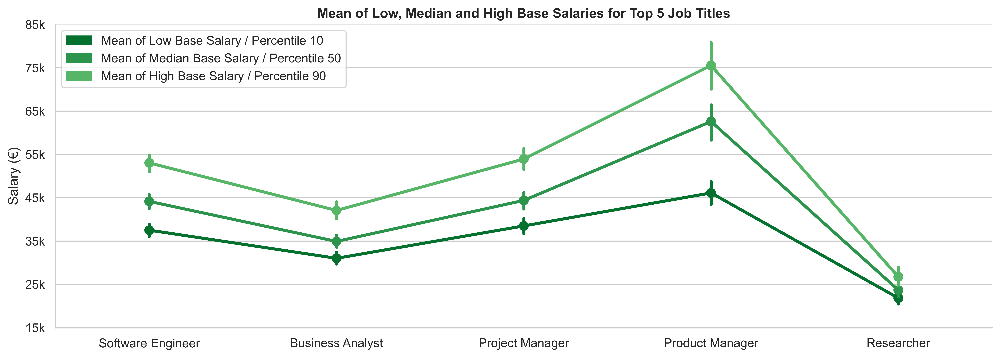

In [57]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,5))
colors = [c for c in sns.color_palette('Greens_r')[:3]]
sns.pointplot(data=salaries_top_normalized_job_title_annual, seed=42,
              x='normalized_job_title', y='pay_percentile_10', color=colors[0])
sns.pointplot(data=salaries_top_normalized_job_title_annual, seed=42,
              x='normalized_job_title', y='pay_percentile_50', color=colors[1])
sns.pointplot(data=salaries_top_normalized_job_title_annual, seed=42,
              x='normalized_job_title', y='pay_percentile_90', color=colors[2])
yticks = np.arange(15000, 95000, 10000)
ytickslabels = ['{}k'.format(int(y/1000)) for y in yticks]
plt.yticks(yticks, ytickslabels)
legend_handles = []
legend_labels = ['Mean of Low Base Salary / Percentile 10', 'Mean of Median Base Salary / Percentile 50', 
                 'Mean of High Base Salary / Percentile 90']
for entry in zip(colors, legend_labels):
    legend_handles.append(mpatches.Patch(color=entry[0], label=entry[1]))
plt.legend(handles=legend_handles)
plt.xlabel('')
plt.ylabel('Salary (€)')
plt.title('Mean of Low, Median and High Base Salaries for Top 5 Job Titles', weight='bold');
sns.despine()

In [58]:
n_employees_index_dict = {}
n_employees_names = np.array(n_employees_type.categories)
n_employees_names = np.append(n_employees_names, 'Multiple Company Sizes')
for i in range(len(n_employees_names)):
    n_employees_index_dict[n_employees_names[i]] = i
n_employees_index_dict

{'1 to 50 employees': 0,
 '51 to 200 employees': 1,
 '201 to 500 employees': 2,
 '501 to 1000 employees': 3,
 '1001 to 5000 employees': 4,
 '5001 to 10000 employees': 5,
 '10000+ employees': 6,
 'Multiple Company Sizes': 7}

In [59]:
top_normalized_job_title_location_industry_names = glassdoor_top_normalized_job_title_location.industry.value_counts(ascending=True)[-5:].index
top_normalized_job_title_location_industry_names = np.array(top_normalized_job_title_location_industry_names)
top_normalized_job_title_location_industry_names = np.append(top_normalized_job_title_location_industry_names,
                                                             'Multiple Industries')
mask_top_normalized_job_title_location_industry = glassdoor_top_normalized_job_title_location.industry.isin(top_normalized_job_title_location_industry_names)
top_normalized_job_title_location_industry_index_dict = {}
for i in range(len(top_normalized_job_title_location_industry_names)):
    top_normalized_job_title_location_industry_index_dict[top_normalized_job_title_location_industry_names[i]] = i
top_normalized_job_title_location_industry_index_dict

{'Consulting': 0,
 'Enterprise Software & Network Solutions': 1,
 'Computer Hardware & Software': 2,
 'IT Services': 3,
 'Internet': 4,
 'Multiple Industries': 5}

In [60]:
# Group job listings, by job titles, location and company size
glassdoor_top_normalized_job_title_location_n_employees = glassdoor_top_normalized_job_title_location.groupby(
    by=['normalized_job_title', 'location', 'n_employees']).size()
# Reset the index to create a dataframe out of the group
glassdoor_top_normalized_job_title_location_n_employees = glassdoor_top_normalized_job_title_location_n_employees.reset_index(name='count')

# Store the top locations and normalized job titles as list
unique_locations = glassdoor_top_normalized_job_title_location_n_employees.location.unique()
unique_titles = glassdoor_top_normalized_job_title_location_n_employees.normalized_job_title.unique()

# Initialize 2 new variables
# n_employees_index: The numerical values that translates to the company size category
# n_employees_multi: Is True in case the highest frequency count of company size based on the relationship of 
# top locations and normalized job titles is shared among multiple company sizes and not 0
glassdoor_top_normalized_job_title_location_n_employees['n_employees_index'] = np.nan
glassdoor_top_normalized_job_title_location_n_employees['n_employees_multi'] = np.nan

# List to track the records for which multiple company sizes have the highest frequency count
track_mutliple_n_employees_max_counts = []

# Iterate through the unique job titles
for t in unique_titles:
    # Iterate through the unique locations
    for l in unique_locations:
        # Select the job title and location
        mask_t_l = (glassdoor_top_normalized_job_title_location_n_employees.normalized_job_title == t) & (
            glassdoor_top_normalized_job_title_location_n_employees.location == l)
        # Get the highest frequency count
        max_count = glassdoor_top_normalized_job_title_location_n_employees[mask_t_l]['count'].max()
        # If the count is 0, continue with the next location the combination of job title and location and 
        # any company size has 0 records
        if max_count == 0:
            break
        # Select the records with the highest frequency count for the selected job title and location
        mask_max_count = (mask_t_l) & (glassdoor_top_normalized_job_title_location_n_employees['count'] == max_count)
        # Get the company size values of those records
        max_n_employees = glassdoor_top_normalized_job_title_location_n_employees[mask_max_count].n_employees.values
        # If there exists more than 1 value, set n_employees_multi to True and 
        # add the value 7 to n_employees_index for only the first record (the pivot table required for the heatmap cannot
        # contain duplicate entries)
        if len(max_n_employees) > 1:
            # Add the information to a list as double check
            track_mutliple_n_employees_max_counts.append({'t': t, 'l': l, 'max_count': max_count, 
                                                          'max_n_employees': max_n_employees})
            glassdoor_top_normalized_job_title_location_n_employees.loc[
                glassdoor_top_normalized_job_title_location_n_employees[mask_max_count].index, 'n_employees_multi'] = True
            glassdoor_top_normalized_job_title_location_n_employees.loc[
                glassdoor_top_normalized_job_title_location_n_employees[mask_max_count].index[0], 
                'n_employees_index'] = 7
        # There exists just 1 value
        else:
            # Add the respective index value for the company size with the highest frequency count using
            # the previously defined dictionary to column n_employees_index
            glassdoor_top_normalized_job_title_location_n_employees.loc[
                glassdoor_top_normalized_job_title_location_n_employees[mask_max_count].index, 
                'n_employees_index'] = n_employees_index_dict.get(max_n_employees[0], np.nan)

# Below print the information in case the highest frequency count for a certain job title
# and location was shared among multiple company sizes

# Print the list with as double check
print(track_mutliple_n_employees_max_counts)

# Print the dataframe, it should have the same information as the list previously print
glassdoor_top_normalized_job_title_location_n_employees[
    glassdoor_top_normalized_job_title_location_n_employees.n_employees_multi == True]

[{'t': 'Data Engineer', 'l': 'Köln', 'max_count': 3, 'max_n_employees': ['201 to 500 employees', '1001 to 5000 employees', '10000+ employees']
Categories (7, object): ['1 to 50 employees' < '51 to 200 employees' < '201 to 500 employees' < '501 to 1000 employees' < '1001 to 5000 employees' < '5001 to 10000 employees' < '10000+ employees']}, {'t': 'Data Analyst', 'l': 'Köln', 'max_count': 3, 'max_n_employees': ['1 to 50 employees', '51 to 200 employees', '1001 to 5000 employees']
Categories (7, object): ['1 to 50 employees' < '51 to 200 employees' < '201 to 500 employees' < '501 to 1000 employees' < '1001 to 5000 employees' < '5001 to 10000 employees' < '10000+ employees']}, {'t': 'Business Analyst', 'l': 'Hamburg', 'max_count': 3, 'max_n_employees': ['1 to 50 employees', '501 to 1000 employees', '10000+ employees']
Categories (7, object): ['1 to 50 employees' < '51 to 200 employees' < '201 to 500 employees' < '501 to 1000 employees' < '1001 to 5000 employees' < '5001 to 10000 employees'

,normalized_job_title,location,n_employees,count,n_employees_index,n_employees_multi
58,Data Engineer,Köln,201 to 500 employees,3,7.0,True
60,Data Engineer,Köln,1001 to 5000 employees,3,NaN,True
62,Data Engineer,Köln,10000+ employees,3,NaN,True
126,Data Analyst,Köln,1 to 50 employees,3,7.0,True
127,Data Analyst,Köln,51 to 200 employees,3,NaN,True
130,Data Analyst,Köln,1001 to 5000 employees,3,NaN,True
154,Business Analyst,Hamburg,1 to 50 employees,3,7.0,True
157,Business Analyst,Hamburg,501 to 1000 employees,3,NaN,True
160,Business Analyst,Hamburg,10000+ employees,3,NaN,True
164,Business Analyst,Köln,501 to 1000 employees,6,7.0,True


In [61]:
# Group job listings, by job titles, location and industry
glassdoor_top_normalized_job_title_location_industry = glassdoor_top_normalized_job_title_location[
    mask_top_normalized_job_title_location_industry].groupby(
    by=['normalized_job_title', 'location', 'industry']).size()
# Reset the index to create a dataframe out of the group
glassdoor_top_normalized_job_title_location_industry = glassdoor_top_normalized_job_title_location_industry.reset_index(name='count')

# Store the top locations and normalized job titles as list
unique_locations = glassdoor_top_normalized_job_title_location_industry.location.unique()
unique_titles = glassdoor_top_normalized_job_title_location_industry.normalized_job_title.unique()

# Initialize 2 new variables
# n_employees_index: The numerical values that translates to the industry string
# n_employees_multi: Is True in case the highest frequency count of industry based on the relationship of 
# top locations and normalized job titles is shared among multiple industries and not 0
glassdoor_top_normalized_job_title_location_industry['industry_index'] = np.nan
glassdoor_top_normalized_job_title_location_industry['industry_multi'] = np.nan

# List to track the records for which multiple industries have the highest frequency count
track_mutliple_industry_max_counts = []

# Iterate through the unique job titles
for t in unique_titles:
    # Iterate through the unique locations
    for l in unique_locations:
        # Select the job title and location
        mask_t_l = (glassdoor_top_normalized_job_title_location_industry.normalized_job_title == t) & (
            glassdoor_top_normalized_job_title_location_industry.location == l)
        # Get the highest frequency count
        max_count = glassdoor_top_normalized_job_title_location_industry[mask_t_l]['count'].max()
        # If the count is 0, continue with the next location the combination of job title and location and 
        # any industry has 0 records
        if max_count == 0:
            break
        # Select the records with the highest frequency count for the selected job title and location
        mask_max_count = (mask_t_l) & (glassdoor_top_normalized_job_title_location_industry['count'] == max_count)
        # Get the industry values of those records
        max_industry = glassdoor_top_normalized_job_title_location_industry[mask_max_count].industry.values
        # If there exists more than 1 value, set industry_multi to True and 
        # add the value 5 to industry_index for only the first record (the pivot table required for the heatmap cannot
        # contain duplicate entries)
        if len(max_industry) > 1:
            # Add the information to a list as double check
            track_mutliple_industry_max_counts.append({'t': t, 'l': l, 'max_count': max_count, 
                                                       'max_industry': max_industry})
            glassdoor_top_normalized_job_title_location_industry.loc[
                glassdoor_top_normalized_job_title_location_industry[mask_max_count].index, 'industry_multi'] = True
            glassdoor_top_normalized_job_title_location_industry.loc[
                glassdoor_top_normalized_job_title_location_industry[mask_max_count].index[0], 
                'industry_index'] = 5
        # There exists just 1 value
        else:
            # Add the respective index value for the industry with the highest frequency count using
            # the previously defined dictionary to column industry_index
            glassdoor_top_normalized_job_title_location_industry.loc[
                glassdoor_top_normalized_job_title_location_industry[mask_max_count].index, 
                'industry_index'] = top_normalized_job_title_location_industry_index_dict.get(max_industry[0], np.nan)

# Below print the information in case the highest frequency count for a certain job title
# and location was shared among multiple industries

# Print the list with as double check
print(track_mutliple_industry_max_counts)

# Print the dataframe, it should have the same information as the list previously print
glassdoor_top_normalized_job_title_location_industry[
    glassdoor_top_normalized_job_title_location_industry.industry_multi == True]

[{'t': 'Project Manager', 'l': 'Frankfurt am Main', 'max_count': 4, 'max_industry': array(['Consulting', 'IT Services'], dtype=object)}, {'t': 'Product Manager', 'l': 'Frankfurt am Main', 'max_count': 2, 'max_industry': array(['Computer Hardware & Software',
       'Enterprise Software & Network Solutions'], dtype=object)}, {'t': 'Product Manager', 'l': 'Köln', 'max_count': 1, 'max_industry': array(['Consulting', 'Enterprise Software & Network Solutions',
       'Internet'], dtype=object)}]


,normalized_job_title,location,industry,count,industry_index,industry_multi
156,Project Manager,Frankfurt am Main,Consulting,4,5.0,True
158,Project Manager,Frankfurt am Main,IT Services,4,NaN,True
180,Product Manager,Frankfurt am Main,Computer Hardware & Software,2,5.0,True
182,Product Manager,Frankfurt am Main,Enterprise Software & Network Solutions,2,NaN,True
191,Product Manager,Köln,Consulting,1,5.0,True
192,Product Manager,Köln,Enterprise Software & Network Solutions,1,NaN,True
194,Product Manager,Köln,Internet,1,NaN,True


## Which combination of Job Titles and Top 5 Locations and provides the most Job Listings for each Company Size?

The most listings for each Company Size are provided by the following combinations:

* 10000+ employees: In Berlin are Data Scientists, Business Analysts, Machine Learning Engineers and Reseacher most listed;  The largest listing counts for Data Scientists, Data Analysts, Business Analysts and Project Manager are in  Frankfurt am Main
* 5001 to 10000 employees: Only in München (Munich) are Machine Learning Engineers listed with the highest frequency
* 1001 to 5000 employees: Software Engineers, Data Scientists and Researchers in Köln (Cologne)
* 501 to 1000 employees: Köln most frequently lists Product Owner and Product Manager
* 201 to 500 employees: Listings for Data Engineers in München, Data Scientist in Hamburg and Product Manager in Frankfurt am Main have the highest frequency
* 51 to 200 employees: Berlin lists the most jobs for Data Engineer, Data Analyst, Product Owner and Product Manager
* 1 to 50 employees: Software Engineers, Data Scientists, Data Analysts and Project Managers are most listed in München

<p style='text-align:center'>Continue   <span>&#9660;</span><p/>

Further observations:
* In 3 out of 5 locations are Software Engineers most listed for companies with 1 to 50 employees.
* In 3 out of 5 locations are Product Owners the most listed for companies with 51 to 200 employees.
* Companies with more than 10000+ employees provide listings for Business Analysts for 3 out of 5 locations.
* Especially the location Köln, as well as all other location have occasionally listings for individual job titles for which the highest frequency count is shared among multiple company sizes.

<p style='text-align:center'>Illustration   <span>&#9660;</span><p/>

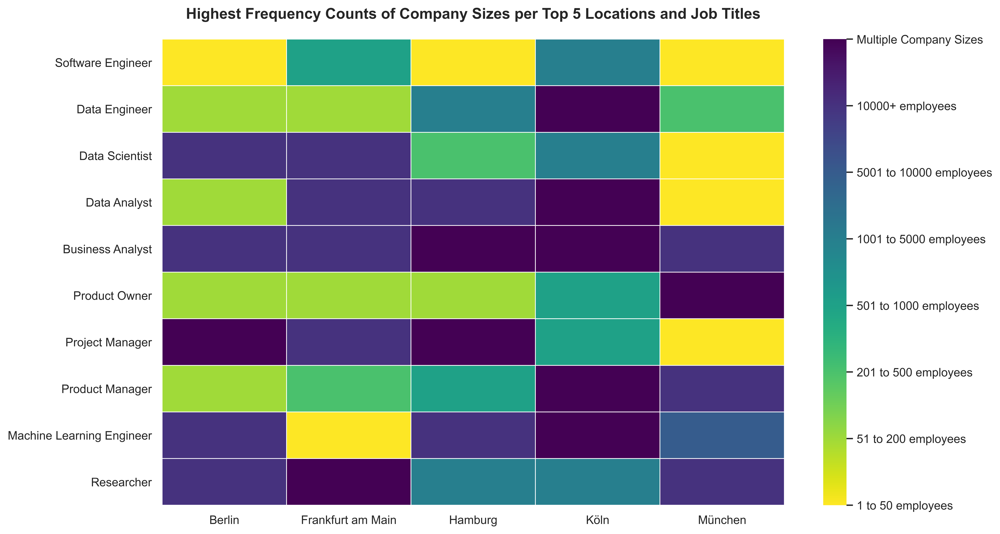

In [62]:
heatmap_glassdoor_top_normalized_job_title_location_n_employees = glassdoor_top_normalized_job_title_location_n_employees[
    glassdoor_top_normalized_job_title_location_n_employees.n_employees_index.notnull()].pivot(
    index='normalized_job_title', columns='location', values='n_employees_index')
f, ax = plt.subplots(figsize=(13,8))
ax = sns.heatmap(heatmap_glassdoor_top_normalized_job_title_location_n_employees, fmt='.0f', linewidths=.5, ax=ax, 
                 cmap='viridis_r',);
cbar = ax.collections[0].colorbar
cbar.set_ticks([n_employees_index_dict.get(i) for i in n_employees_names])
cbar.set_ticklabels(n_employees_names)
plt.xlabel('')
plt.ylabel('')
plt.title('Highest Frequency Counts of Company Sizes per Top 5 Locations and Job Titles', 
          weight='bold', fontsize=14, y=1.03);

## Which combination of Job Titles and Top 5 Locations and provides the most Job Listings for each of the Top 5 Industries?


The most listings for each Industry are provided by the following combinations:
* Internet: The focus of the Internet industry is Berlin. The listing for all job titles besides for Product Owners have the highest frequency in Berlin. In 3 out of 5 locations are Software Engineers for the Internet industry the most listed.
* IT Services: In Hamburg the most listings for Software Engineers, Data Engineers, Data Scientists, Business Analysts and Project Managers are for the IT Services industry. 
* Consulting: The most listings within the Consulting industry are in Frankfurt am Main for Software Engineers, Data Scientists, Business Analysts and Product Owners. 
* Enterprise Software & Network Solutions: Listings for which the Enterprise Software & Network Solutions industry has the highest frequency are rare. Only Product Owners in Berlin are most listed by this industry.
* Computer Hardware & Software industry: Just in Hamburg and just Product Managers are most listed for this industry.

<p style='text-align:center'>Continue   <span>&#9660;</span><p/>

Further observations:
* The Internet industry has the highest frequency for the most combinations of location and job titles. 
* In 2 out of 5 locations are Data Scientists, Business Analysts and Project Manager for the Consulting industry the most listed.
* Data Engineer for the IT Services industry are listed most frequent in 3 out of 5 locations.
* For some combination of the top 5 locations and top 5 normalized job titles no listing within the top 5 industries exists. Only in Berlin job listings for Data Analysts, Machine Learning Engineers and Researchers exist within the top 5 industries. For Product Owner in Köln (Cologne) and München (Munich) no listing within the top 5 industries exist.
* Only the locations Frankfurt am Main and Köln have occasionally listings for individual job titles for which the highest frequency count is shared among multiple industries.

<p style='text-align:center'>Illustration   <span>&#9660;</span><p/>

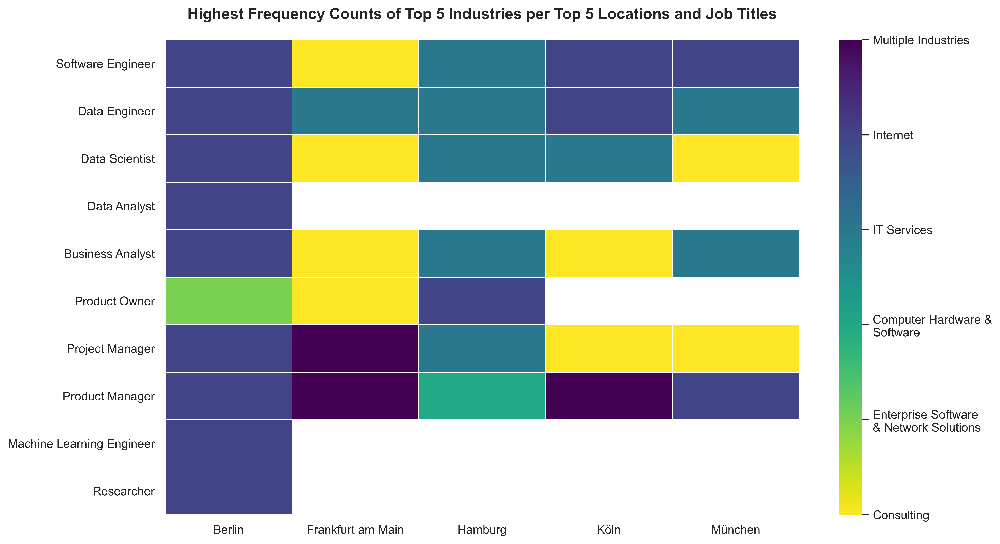

In [63]:
heatmap_glassdoor_top_normalized_job_title_location_industry = glassdoor_top_normalized_job_title_location_industry[
    glassdoor_top_normalized_job_title_location_industry.industry_index.notnull()].pivot(
    index='normalized_job_title', columns='location', values='industry_index')
f, ax = plt.subplots(figsize=(13,8))
ax = sns.heatmap(heatmap_glassdoor_top_normalized_job_title_location_industry, fmt='.0f', linewidths=.5, ax=ax, 
                 cmap='viridis_r',);
cbar = ax.collections[0].colorbar
cbar.set_ticks([top_normalized_job_title_location_industry_index_dict.get(i) for i in 
                top_normalized_job_title_location_industry_names])
cbar_labels = ['\n'.join(wrap(l, 20)) for l in top_normalized_job_title_location_industry_names]
cbar.set_ticklabels(cbar_labels)
plt.xlabel('')
plt.ylabel('')
plt.title('Highest Frequency Counts of Top 5 Industries per Top 5 Locations and Job Titles', 
          weight='bold', fontsize=14, y=1.03);

## Which combination of the Top 5 Job Titles and Company Sizes provides the most Reported Salaries?

The top 5 job title and company size combinations with the largest count of reported salaries are:
* 10000+ employees: Software Engineers, Business Analysts, Project Manager, Product Manager and Reseacher (ranked by count; Software Engineers have the largest count by far, which is approx. 8 times larger than the second largest count for Business Analysts and Project Manager; 10000+ employees have the largest counts for each of the top 5 job titles)
* 5001 to 10000 employees: Researcher
* 1001 to 5000 employees: Project Manager
* 501 to 1000 employees: Business Analyst
* 201 to 500 employees: Software Engineer
* 51 to 200 employees: Researcher
* 1 to 50 employees: Researcher

<p style='text-align:center'>Continue   <span>&#9660;</span><p/>

Further observations:
* For some combination of normalized job titles and company sizes no reported salaries exists. Especially, for companies with 1 to 50 employees for 3 out of 5 top normalized job titles (Business Analyst, Project and Prouct Manager), no salary report exists. For next larger company size with 51 to 200 employee, Business Analysts and Project Manager salary reports do not exist, too.
* In general it seems like that the more employees a company has, the more salaries for the top 5 normalized job titles are reported.

<p style='text-align:center'>Illustration   <span>&#9660;</span><p/>

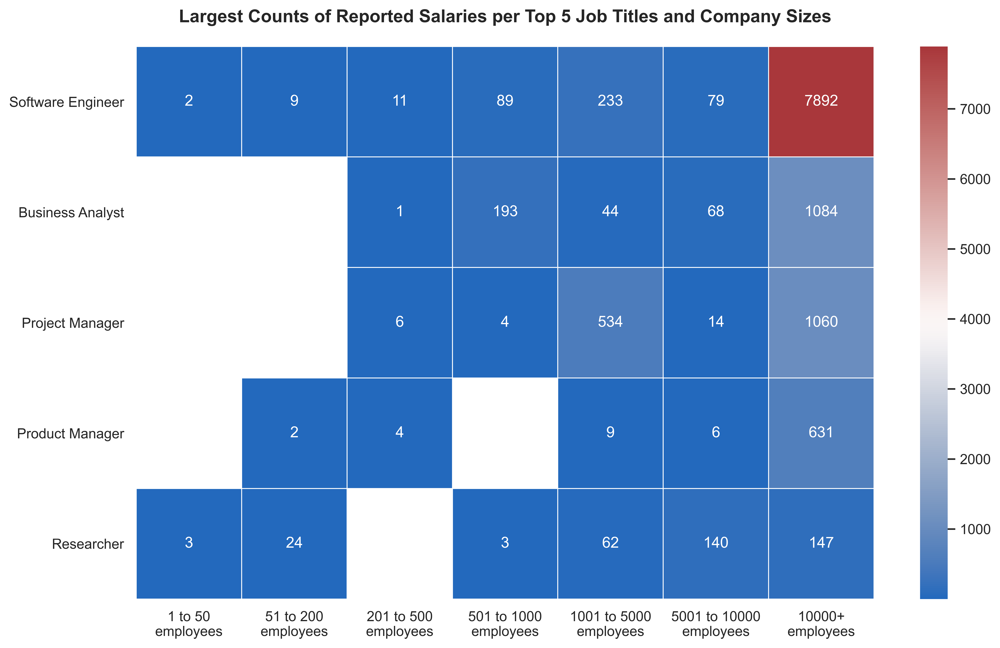

In [64]:
sns.set_style("whitegrid")
base_pay_count_sum = salaries_top_normalized_job_title_annual.groupby(by=['normalized_job_title', 
                                                                          'n_employees']).base_pay_count.sum()
base_pay_count_sum = base_pay_count_sum.reset_index(name='base_pay_count_sum')
base_pay_count_sum.loc[base_pay_count_sum[base_pay_count_sum.base_pay_count_sum == 0].index, 
                       'base_pay_count_sum'] =  np.nan
base_pay_count_sum = base_pay_count_sum.pivot(index='normalized_job_title', columns='n_employees', 
                                              values = 'base_pay_count_sum')
f, ax = plt.subplots(figsize=(13,8))
sns.heatmap(base_pay_count_sum, annot=True, fmt='.0f', linewidths=.5, ax=ax, cmap='vlag')
xticklabels = ['\n'.join(wrap(l, 15)) for l in n_employees_type.categories]
ax.set_xticklabels(xticklabels, ha='center', va='top', rotation=0)
plt.xlabel('')
plt.ylabel('')
plt.title('Largest Counts of Reported Salaries per Top 5 Job Titles and Company Sizes', 
          weight='bold', fontsize=14, y=1.03);

## Which combination of the Top 5 Job Titles and Top 5 Industries provides the most Reported Salaries?

Among the combinations of the top 5 job titles and top 5 industries, the ranking of the largest number of reported salaries is as follows:
1. Software Engineers in Internet (largest count by far, which is approx. 10 times larger than the second largest count across the top 5 job titles and industries; Internet industry has the largest count among the top 5 normalized job titles)
1. Business Analysts in Consulting (third largest count among the top 5 normalized job titles)
1. Software Engineers in IT Services (second largest count among the top 5 normalized job titles)
1. Project Manager in IT Services
1. Product Managers in Internet
1. Researchers in Research & Development
1. Researchers in Biotech & Pharmaceuticals

<p style='text-align:center'>Continue   <span>&#9660;</span><p/>

Missing reported salaries:
* For some combination of normalized job titles and industry no reported salaries exists. 
* Only for Software Engineers and Project Manager salary reports for each of the top 5 industries exist.
* Especially, for Reseachers for 3 out of 5 top industries (Consulting, IT Services and Internet) no salary report exists.
* Only for Biotech & Pharmaceutical industry salary reports for each of the top 5 normalized job titles exist.
* The Consulting industry only has 4 out of 5, followed by the remaining top 5 industries with 3 out of 5 reported salaries among the top 5 normalized job titles.

<p style='text-align:center'>Illustration   <span>&#9660;</span><p/>

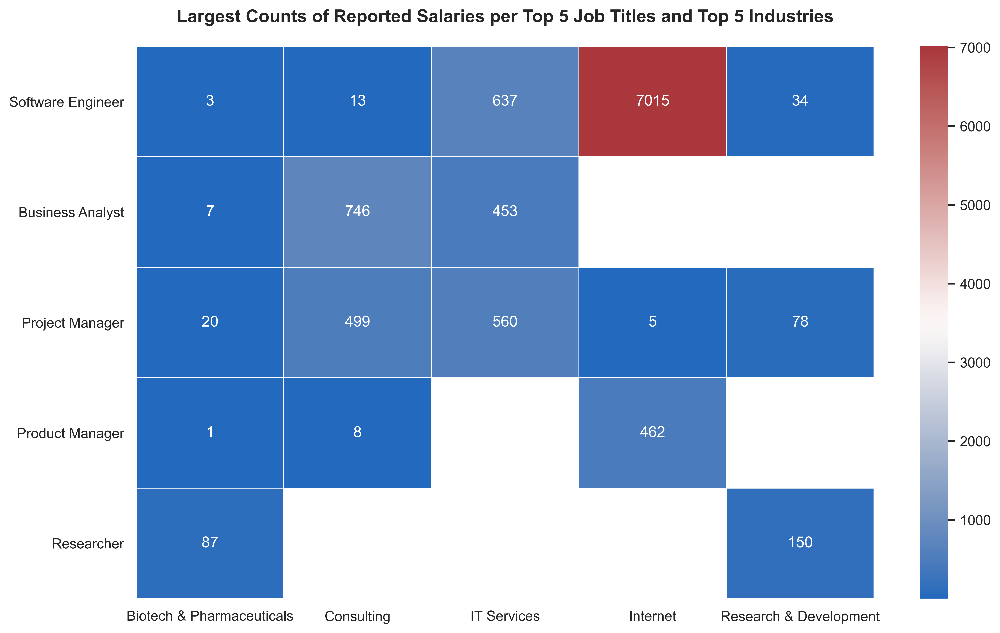

In [65]:
sns.set_style("whitegrid")
salaries_top_normalized_job_title_annual_industry_names = salaries_top_normalized_job_title_annual.industry.value_counts()[:5].index
mask_salaries_top_normalized_job_title_annual_industry = salaries_top_normalized_job_title_annual.industry.isin(
    salaries_top_normalized_job_title_annual_industry_names)
base_pay_count_sum = salaries_top_normalized_job_title_annual[
    mask_salaries_top_normalized_job_title_annual_industry].groupby(
    by=['normalized_job_title', 'industry']).base_pay_count.sum()
base_pay_count_sum = base_pay_count_sum.reset_index(name='base_pay_count_sum')
base_pay_count_sum.loc[base_pay_count_sum[base_pay_count_sum.base_pay_count_sum == 0].index, 
                       'base_pay_count_sum'] =  np.nan
base_pay_count_sum = base_pay_count_sum.pivot(index='normalized_job_title', columns='industry', 
                                              values = 'base_pay_count_sum')
f, ax = plt.subplots(figsize=(13,8))
sns.heatmap(base_pay_count_sum, annot=True, fmt='.0f', linewidths=.5, ax=ax, cmap='vlag')
plt.xlabel('')
plt.ylabel('')
plt.title('Largest Counts of Reported Salaries per Top 5 Job Titles and Top 5 Industries', 
          weight='bold', fontsize=14, y=1.03);

## Which combination of the Top 5 Job Titles and Company Sizes provides the Highest Median Salaries?

The highest median of the reported median salaries is represented by each of the following top 5 job title and company size combinations:
* 10000+ employees: Product Manager (highest median salary considering all company sizes for the top 5 normnalized job title)
* 5001 to 10000 employees: Project Manager (very closely followed by Product Manager)
* 1001 to 5000 employees: Product Manager
* 501 to 1000 employees: Project Manager
* 201 to 500 employees: Software Engineer
* 51 to 200 employees: Software Engineer
* 1 to 50 employees: Software Engineer

Larger companies have higher median salaries for Product Manager and smaller companies have higher median salaries for Software Engineers.

<p style='text-align:center'>Illustration   <span>&#9660;</span><p/>

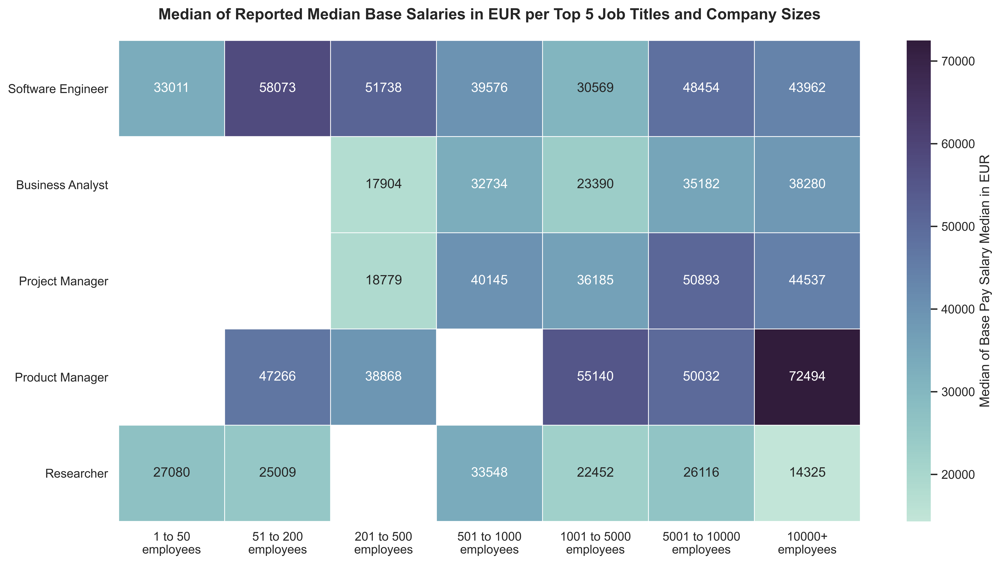

In [66]:
sns.set_style("whitegrid")
salaries_top_normalized_job_title_annual_perc_50_median = salaries_top_normalized_job_title_annual.groupby(
    by=['normalized_job_title', 'n_employees']).pay_percentile_50.median()
salaries_top_normalized_job_title_annual_perc_50_median = salaries_top_normalized_job_title_annual_perc_50_median.reset_index(
    name='50_median')
salaries_top_normalized_job_title_annual_perc_50_median = salaries_top_normalized_job_title_annual_perc_50_median.pivot(
    index='normalized_job_title', columns='n_employees', values='50_median')
f, ax = plt.subplots(figsize=(15,8))
cmap = sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)
sns.heatmap(salaries_top_normalized_job_title_annual_perc_50_median, annot=True, fmt='.0f', linewidths=.5, ax=ax, 
                 cmap=cmap, cbar_kws = {'label' : 'Median of Base Pay Salary Median in EUR'})
xticklabels = ['\n'.join(wrap(l, 15)) for l in n_employees_type.categories]
ax.set_xticklabels(xticklabels, ha='center', va='top', rotation=0)
plt.xlabel('')
plt.ylabel('')
plt.title('Median of Reported Median Base Salaries in EUR per Top 5 Job Titles and Company Sizes', 
          weight='bold', fontsize=14, y=1.03);

## Which combination of the Top 5 Job Titles and Top 5 Industries provides the Highest Median Salaries?

Among the combinations of the top 5 normalized job titles and top 5 industries the ranking of the highest median reported salaries is as follows:
1. Product Manager in Internet (equals the highest salary among the top 5 industries and job titles)
1. Business Analysts in Biotech & Pharmaceutical
1. Project Manager in IT Services
1. Product Managers in Consulting
1. Software Engineers in Internet 
1. Project Manager in Research & Development (equals the lowest salary among the top 5 industries for Project Manager)
1. Researchers in Research & Development

<p style='text-align:center'>Illustration   <span>&#9660;</span><p/>

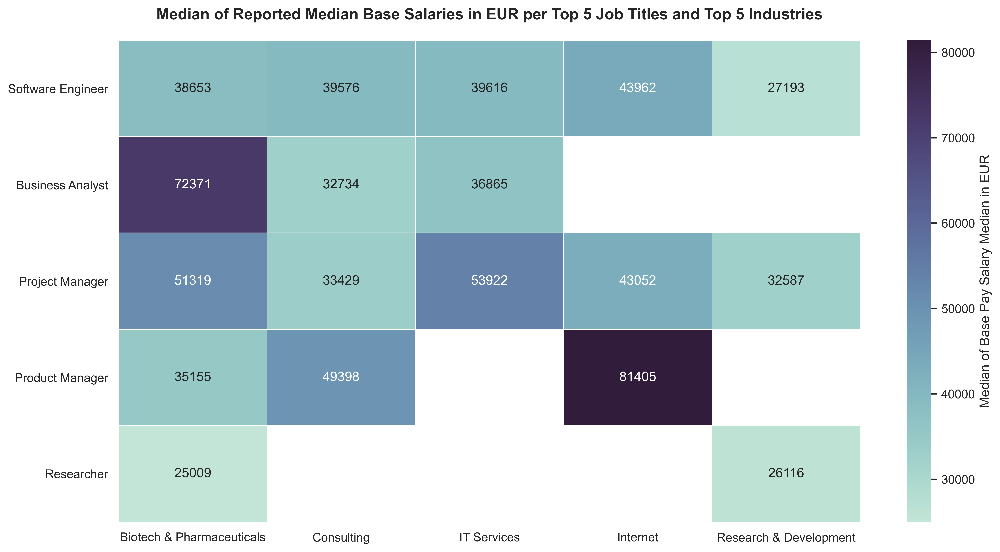

In [67]:
sns.set_style("whitegrid")
salaries_top_normalized_job_title_annual_industry_perc_50_median = salaries_top_normalized_job_title_annual[
    mask_salaries_top_normalized_job_title_annual_industry].groupby(
    by=['normalized_job_title', 'industry']).pay_percentile_50.median()
salaries_top_normalized_job_title_annual_industry_perc_50_median = salaries_top_normalized_job_title_annual_industry_perc_50_median.reset_index(
    name='50_median')
salaries_top_normalized_job_title_annual_industry_perc_50_median = salaries_top_normalized_job_title_annual_industry_perc_50_median.pivot(
    index='normalized_job_title', columns='industry', values='50_median')
f, ax = plt.subplots(figsize=(15, 8))
cmap = sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)
sns.heatmap(salaries_top_normalized_job_title_annual_industry_perc_50_median, annot=True, fmt='.0f', linewidths=.5, ax=ax, 
                 cmap=cmap, cbar_kws = {'label' : 'Median of Base Pay Salary Median in EUR'})
plt.xlabel('')
plt.ylabel('')
plt.title('Median of Reported Median Base Salaries in EUR per Top 5 Job Titles and Top 5 Industries', 
          weight='bold', fontsize=14, y=1.03);

## Conclusion

### For what kind of job in the field of data science and related disciplines in Germany should you apply?

Based on the job listings, the companies with up to 200 employees in the Internet Industry are looking especially for Software Engineers in Berlin. 

### What's the median salary for such a job in Germany?

Smaller companies have higher median base salaries for Software Engineers compared to larger companies. The median base salary is between 33,000 and 58,000 Euro.

### Looking for a higher salary?

The highest median base salaries with approx. 72,000 Euro have been reported for Product Managers of companies with more than 10,000 employees. Product Manager in Internet industry have a median salary of roughly 82,000 Euro. 

Product Manager jobs are listed in companies with the companies with up to 200 employees or with more than 10000 employees in the Internet industry in Berlin as well as in München.

## Limitations

* The examination relies on data scraped on the 10th of December 2019 Glassdoor data from [Glassdoor](https://www.glassdoor.co.uk). See Acknowlegdement (next slide) for further details.
* The investigation relies on job listings mainly posted in October and November 2019.
* The job titles of the job listings were normalized. The same normalized titles were used for normalization of the job titles for the reported salaries.
* The job level information for reported salaries and job listings is not considered.
* The age of reported salaries for job tiltes on Glassdoor is not known.

## Acknowlegdement, License & Disclaimer
The examination relies on the dataset provided by André Sionek on [Kaggle](https://www.kaggle.com/andresionek/data-jobs-listings-glassdoor). The information provided on Kaggle and the [GitHub repository](https://github.com/andresionek91/Job-Listing-Scraper) states how the data was scraped and prepared. The data was scraped on the 10th of December 2019 from [Glassdoor](https://www.glassdoor.co.uk). The data is available under the Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International Public License (CC BY-NC-SA 4.0). This data analysis project was done for personal educational purposes only. The author does not have any connection to Glassdoor.

In [68]:
!jupyter nbconvert glassdoor_germany_exploration_slides.ipynb --to slides --post serve --no-input --no-prompt

[NbConvertApp] Converting notebook glassdoor_germany_exploration_slides.ipynb to slides
[NbConvertApp] Writing 12946641 bytes to glassdoor_germany_exploration_slides.slides.html
[NbConvertApp] Redirecting reveal.js requests to https://cdnjs.cloudflare.com/ajax/libs/reveal.js/3.5.0
Traceback (most recent call last):
  File "C:\Tools\anaconda3\envs\we_rate_dogs\Scripts\jupyter-nbconvert-script.py", line 10, in <module>
    sys.exit(main())
  File "C:\Tools\anaconda3\envs\we_rate_dogs\lib\site-packages\jupyter_core\application.py", line 254, in launch_instance
    return super(JupyterApp, cls).launch_instance(argv=argv, **kwargs)
  File "C:\Tools\anaconda3\envs\we_rate_dogs\lib\site-packages\traitlets\config\application.py", line 845, in launch_instance
    app.start()
  File "C:\Tools\anaconda3\envs\we_rate_dogs\lib\site-packages\nbconvert\nbconvertapp.py", line 350, in start
    self.convert_notebooks()
  File "C:\Tools\anaconda3\envs\we_rate_dogs\lib\site-packages\nbconvert\nbconvertap